In [2]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy as np
import time
import scipy.stats as stats
import os
from math import radians, cos, sin, asin, sqrt
from statistics import mean
import pandas as pd

np.set_printoptions(formatter={'float_kind':"{:.5f}".format})

#Euclidean distance function between two (x,y) points
def dist(a, b):
    (x1, y1) = a
    (x2, y2) = b
    return ((x1 - x2) ** 2 + (y1 - y2) ** 2) ** 0.5

#Haversine distance between two (lat,long) points
def hdist(a1,b1):
    (lat1, long1) = a1
    (lat2, long2) = b1
    # convert decimal degrees to radians 
    lat1, long1, lat2, long2 = map(radians, [lat1/1000000, long1/1000000, lat2/1000000, long2/1000000])
    # haversine formula 
    dlon = long2 - long1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    if a < 0:
        print(lat1, long1,lat2, long2,a)
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km

#Normalizes each column from 0 to 1 in a 2 dimensional array
def norm_column_wise(arr):
    return np.nan_to_num((arr-arr.min(0))/(arr.max(0)-arr.min(0)))

#Range voting mechanism that takes normalized path costs, calculates the total score for each plan, and returns the total scores, the minimum score, and the plan with the minimum score
def range_voting(normalized_paths_costs):
    scores = np.sum(normalized_paths_costs, axis=1)
    min_score = np.min(scores)
    best_path = np.argmin(scores)
    return scores, min_score, best_path

#Borda voting mechanism that takes normalized path costs, calculates the ranks for each column then the points (max rank + 1 - rank), then the total Borda scores
#it returns the total Borda scores, the maximum score, and the plan with the maximum score
def borda_voting(normalized_paths_costs):
    s = pd.DataFrame(normalized_paths_costs)
    ranks = s.rank(axis=0, method='dense')
    points = (ranks.shape[0]+1)-ranks
    borda_scores = np.sum(points, axis=1)
    best_path = np.argmax(borda_scores)
    max_score = np.sum(normalized_paths_costs[best_path])
    return borda_scores, max_score, best_path

#Combined approval voting mechanism that takes normalized path costs, assigns a value of 1 to plans with a normalized cost of 0, a value of -1 to plans with a normalized cost of 1, and a value of 0 otherwise
#it returns the total approval scores, the maximum score, and the plan with the maximum score
def combined_approval_voting(normalized_paths_costs):
    l = normalized_paths_costs.copy()
    l[l == 1] = -1
    l[(l < 1) & (l > 0)] = 11
    l[l == 0] = 1
    l[l == 11] = 0
    approval_scores = np.sum(l, axis=1)
    best_path = np.argmax(approval_scores)
    max_score = np.sum(normalized_paths_costs[best_path])
    return approval_scores, max_score, best_path

#VBMO takes the graph, the set of objectives, a start and end vertex, and produces a plan that best satisfies the objectives
def vbmo(G, objectives, start, end):
    t0 = time.time() #start timer
    paths = [] #will contain the set of paths
    for obj in objectives: #loop through set of objectives
        path = nx.astar_path(G, start, end, heuristic=dist, weight=obj) #use A* search to find the optimal plan for each objective, all objectives use Euclidean distance as the heuristic by default - change to hdist if you need Haversine distance
        paths.append(path) #add path to list of paths
        #print(obj, "Path: ", path)
    paths_costs = [] #will contain the costs for all the paths under all the objectives - each row is a separate path, each column is a separate objective, each value represents the cost a path for a given objective
    for path in paths: #loop through all the paths
        path_costs = [] #will contain all the costs for a single path
        for obj in objectives: #loop through set of objectives
            length = nx.path_weight(G, path, obj) #calculate total cost of path for each objective
            path_costs.append(length) #add total cost to list of costs for single path
            #print(obj, "Path length: ", length)
        paths_costs.append(path_costs) #add list of path costs for a single path to the list of all paths costs
    normalized_paths_costs = norm_column_wise(np.array(paths_costs)) #normalize all the path costs by column, meaning for each objective, the costs for the all the paths are normalized
    scores, min_score, best_path = range_voting(normalized_paths_costs) #use range voting by default to select the plan - change to another voting method here
    
    t1 = time.time() #end timer
    total_time = t1-t0 #calculate total time
    return [min_score, total_time, paths_costs, paths, best_path] #return relevant information

#Weighted search takes the graph, the set of objectives, a start and end vertex, and produces a plan that equally weights the objectives
def weightedsearch(G, objectives, start, end):
    t0 = time.time() #start timer
    path = nx.astar_path(G, start, end, heuristic=dist, weight="total") #use A* search to find the optimal plan for the total objective, it uses Euclidean distance as the heuristic by default - change to hdist if you need Haversine distance
    cost = nx.path_weight(G, path, "total") 
    #calculate total cost of the path under the total objective
    t1 = time.time() #end timer
    total_time = t1-t0 #calculate total time
    path_costs = [] #will contain all the costs for the weighted plan
    for obj in objectives: #loop through set of objectives
        length = nx.path_weight(G, path, obj) #calculate total cost of path for each objective
        path_costs.append(length) #add total cost to list of costs for the weighted plan
    return [cost, path_costs, total_time, path]

In [3]:
directory = 'dao-map'
 
# iterate over files in that directory
data = []
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
#         print(f)
        file1 = open(f, "r")
        lines = file1.readlines()
        file1.close()

        maptype = lines[0][5:].rstrip('\n')
        height = lines[1][7:].rstrip('\n')
        width = lines[2][6:].rstrip('\n')
        # print(maptype,height,width)
        maparray = []
        for line in lines[4:]:
            maparray.append(list(line.rstrip('\n')))
        # print(maparray)
        # print(len(maparray), len(maparray[0]))
        G = nx.Graph()
        for i in range(len(maparray)):
            for j in range(len(maparray[0])):
                if maparray[i][j] == '.':
                    if i+1 < len(maparray) and maparray[i+1][j] == '.':
                        G.add_edge((i,j), (i+1,j))
                    if j+1 < len(maparray[0]) and maparray[i][j+1] == '.':
                        G.add_edge((i,j), (i,j+1))
                    if i+1 < len(maparray) and j+1 < len(maparray[0]) and maparray[i+1][j+1] == '.':
                        G.add_edge((i,j), (i+1,j+1))
                    if i-1 >= 0 and j+1 < len(maparray[0]) and maparray[i-1][j+1] == '.':
                        G.add_edge((i,j), (i-1,j+1))
        # print(G.edges())
        
        #remove any nodes that are not connected to the largest component of the graph
        if not nx.is_connected(G):
            largest_component = max(nx.connected_components(G), key=len) # Generate connected components and select the largest
            G = G.subgraph(largest_component) # Create a subgraph of G consisting only of this component
        
        objectives = [] #will contain the list of objectives used
        
        #add a distance objective
        for (u,v) in G.edges(): #loop through edges in graph
            if u[0]==v[0] or u[1]==v[1]:
                G.edges[u,v]["distance"] = 1 #adds a dist cost of 1 to horizontal or vertical edges
            else:
                G.edges[u,v]["distance"] = 1.414 #adds a dist cost of 1 to horizontal or vertical edges
        objectives.append("distance")      
        
        #add a uniform cost objective
        for edge in G.edges(): #loop through edges in graph
            G.edges[edge]["uniform"] = 1.5 #adds a uniform cost to all edges
        objectives.append("uniform")        
        
        #add a random cost objective
        randmin = 2
        randmax = 20
        for edge in G.edges(): #loop through edges in graph
            G.edges[edge]["random"] = random.randint(randmin,randmax) #adds a random cost to all edges
        objectives.append("random")    

        #add a safety objective
        for edge in G.edges():
            G.edges[edge]["safety"] = (10-G.degree(edge[0]) + 10-G.degree(edge[1]))/2 #adds a safety cost to each edge = the average of the max degree minus the degree of each node on the edge's ends
        objectives.append("safety")
        
        #add an objective where approximately x% of the nodes are more costly to navigate through
        for node in G.nodes():
            if random.random() <= 0.1: #this is set to 10%
                for ed in G.edges(node):
                    G.edges[ed]["dangerous"] = 10 #if a node is selected, then make the cost of all edges from that node 10
            else:
                for ed in G.edges(node):
                    if not G.edges[ed].get("dangerous"):
                        G.edges[ed]["dangerous"] = 1.5 #if a node is not selected, make the cost of all edges 1.5, unless it was already set to 10
        objectives.append("dangerous")
        
#         #add an objective that groups the graph into areas and assigns costs to the different areas randomly
#         commrandmin = 2
#         commrandmax = 20
#         community = nx.community.greedy_modularity_communities(G) #uses the greedy modularity algorithm to partition the graph into communities
#         for comm in community:
#             commvalue = random.randint(randmin,randmax) #generates a random cost for all edges in the community
#             for node in comm:
#                 for ed in G.edges(node):
#                     if not G.edges[ed].get("greedycommunity"):
#                         G.edges[ed]["greedycommunity"] = commvalue #assigns the random cost to the edges if they don't already have a cost
#         objectives.append("greedycommunity")
        
#         #add an objective that groups the graph into areas and assigns costs to the different areas randomly
#         lcommrandmin = 2
#         lcommrandmax = 20
#         lcommunity = nx.community.louvain_communities(G) #uses the louvain algorithm to partition the graph into communities
#         for comm in lcommunity:
#             commvalue = random.randint(randmin,randmax) #generates a random cost for all edges in the community
#             for node in comm:
#                 for ed in G.edges(node):
#                     if not G.edges[ed].get("louvaincommunity"):
#                         G.edges[ed]["louvaincommunity"] = commvalue #assigns the random cost to the edges if they don't already have a cost
#         objectives.append("louvaincommunity")
        
        # print(objectives) #print out list of objectives
        
        for edge in G.edges(): #loop through edges in graph
            G.edges[edge]["total"] = 0 #create a new objective called "total"
            for obj in objectives: #loop through set of objectives
                G.edges[edge]["total"] += G.edges[edge][obj] #add all the objective values for an edge together and store it in total - this treats all objectives equally
        
        # degrees = [G.degree(n) for n in G.nodes] #calculate degree of all nodes
        # print(filename, nx.number_of_nodes(G), nx.number_of_edges(G), nx.density(G), mean(degrees), nx.degree_histogram(G)) #print out details of graph
        
        numberOfTrials = 10 #number of times to run comparison
        comparison = []
        timecomparison = []
        for it in range(0,numberOfTrials): #for each trial do the following
            start = random.choice(list(G.nodes())) #randomly select start node
            end = random.choice(list(G.nodes())) #randomly select end node
            while start == end: #change end node so that it is not the start node
                end = random.choice(list(G.nodes()))

            vbmoResult = vbmo(G, objectives, start, end) #run VBMO
            weightedResult = weightedsearch(G, objectives, start, end) #run weighted search
            
            combinedPathCosts = norm_column_wise(np.append(vbmoResult[2], [weightedResult[1]], axis=0)) #add the weighted path costs to the path costs from VBMO and then normalize the costs by objective (columnwise) in order to get the normalized scores for the Weighted plan (0 to 1)
            normedScoreForWeighted = np.sum(combinedPathCosts[-1]) #get the total normalized score for Weighted
            paths = vbmoResult[3] #save all the single objective optimal paths from VBMO
            paths.append(weightedResult[3]) #add the path from Weighted
            comparison.append([start,end,vbmoResult[4],vbmoResult[0],normedScoreForWeighted,paths]) #save the results from this trial
            timecomparison.append([vbmoResult[1],weightedResult[2]]) #save the time results from this trial
        
        comparison = np.array(comparison)
        print(filename, "score", np.mean(comparison[:,3], axis=0), np.mean(comparison[:,4], axis=0), stats.ttest_rel(comparison[:,3], comparison[:,4])) #print out the average total score for VBMO's plan, for the Weighted plan, and a ttest to determine if they are significantly different

        timecomparison = np.array(timecomparison)
        print(filename, "time", np.mean(timecomparison[:,0], axis=0), np.mean(timecomparison[:,1], axis=0), stats.ttest_rel(timecomparison[:,0], timecomparison[:,1])) #print out the average time for VBMO, for Weighted, and a ttest to determine if they are significantly different
        
        data.append([filename,comparison,timecomparison])
        
        # edges = G.edges()
        # pos = {(x,y):(y,-x) for x,y in G.nodes()}
        # objectives.append("total")
        # for i in range(len(objectives)):
        #     color = [G[u][v][objectives[i]] for u,v in edges]
        #     plt.figure(figsize=(20,20))
        #     nx.draw(G, pos, with_labels=False, node_size=1, edge_color = color, width=5, edge_cmap = plt.cm.RdYlGn_r)
        #     plt.show()

/tmp/ipykernel_104/570755316.py:133: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  comparison = np.array(comparison)


lak300d.map score 1.6709930675167133 1.2195233831537422 Ttest_relResult(statistic=1.7674518316846417, pvalue=0.11095147925946106)
lak300d.map time 0.17792625427246095 0.05824999809265137 Ttest_relResult(statistic=3.409574913526451, pvalue=0.00775483351551831)
den206d.map score 1.7407530376253746 1.3974547494389622 Ttest_relResult(statistic=1.4711256008582927, pvalue=0.17533610366572777)
den206d.map time 0.10565063953399659 0.024955391883850098 Ttest_relResult(statistic=5.120475842785766, pvalue=0.000627575987870186)


/tmp/ipykernel_104/2348681539.py:39: RuntimeWarning: invalid value encountered in true_divide
  return np.nan_to_num((arr-arr.min(0))/(arr.max(0)-arr.min(0)))


brc101d.map score 1.8428116713319436 1.1846493968562126 Ttest_relResult(statistic=7.438059617434158, pvalue=3.9414939506080686e-05)
brc101d.map time 0.35640864372253417 0.13192598819732665 Ttest_relResult(statistic=4.161411377224236, pvalue=0.0024425840887264735)
oth001d.map score 1.1768499916632427 1.3447631258513302 Ttest_relResult(statistic=-0.5091456156966923, pvalue=0.6228977010009129)
oth001d.map time 0.09685964584350586 0.036412596702575684 Ttest_relResult(statistic=2.036007270933481, pvalue=0.07222981382504691)
orz105d.map score 1.325758867865717 1.7412174833670924 Ttest_relResult(statistic=-1.6548768956686641, pvalue=0.1323348171035049)
orz105d.map time 0.0171506404876709 0.004911637306213379 Ttest_relResult(statistic=4.021156809715608, pvalue=0.003012808672658923)
lgt605d.map score 1.2643592559783081 1.2687295889192192 Ttest_relResult(statistic=-0.027875872787901414, pvalue=0.9783694890978964)
lgt605d.map time 0.03165445327758789 0.011392641067504882 Ttest_relResult(statistic

KeyboardInterrupt: 

In [11]:
directory = 'C:\\Users\\rkorpan\\Documents\\MAPF\\USA-road-d.NY.gr'
 
# iterate over files in
# that directory
data = []
coordinates = []
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    if filename == "USA-road-d.NY.co":
        file1 = open(f, "r")
        lines = file1.readlines()
        file1.close()
        for line in lines:
            coordinates.append(line.rstrip('\n').split())
#         print(len(coordinates))
G = nx.Graph()
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    if filename == "USA-road-d.NY.gr":
#         print(f)
        file1 = open(f, "r")
        lines = file1.readlines()
        file1.close()

        maparray = []
        for line in lines:
            maparray.append(line.rstrip('\n').split())
        
        for i in range(len(maparray)):
            node1 = (int(coordinates[int(maparray[i][1])-1][2]),int(coordinates[int(maparray[i][1])-1][3]))
            node2 = (int(coordinates[int(maparray[i][2])-1][2]),int(coordinates[int(maparray[i][2])-1][3]))
            G.add_edge(node1,node2)
            G.edges[node1,node2]["dist"] = int(maparray[i][3])
            G.edges[node1,node2]["uniform"] = 1000
            G.edges[node1,node2]["rand"] = random.randint(1,37000)
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    if filename == "USA-road-t.NY.gr":
#         print(f)
        file1 = open(f, "r")
        lines = file1.readlines()
        file1.close()

        maparray = []
        for line in lines:
            maparray.append(line.rstrip('\n').split())
        
        for i in range(len(maparray)):
            node1 = (int(coordinates[int(maparray[i][1])-1][2]),int(coordinates[int(maparray[i][1])-1][3]))
            node2 = (int(coordinates[int(maparray[i][2])-1][2]),int(coordinates[int(maparray[i][2])-1][3]))
            G.edges[node1,node2]["time"] = int(maparray[i][3])

objectives = ["dist","uniform","rand","time"]

for edge in G.edges():
    G.edges[edge]["total"] = 0
    for obj in objectives:
        G.edges[edge]["total"] += G.edges[edge][obj]

# print(nx.number_of_nodes(G))
# print(nx.number_of_edges(G))
# print(nx.density(G))
# degrees = [G.degree(n) for n in G.nodes]
# print(mean(degrees))
# print(nx.degree_histogram(G))

comparison = []
timecomparison = []
for it in range(0,50):
    start = random.choice(list(G.nodes()))
    end = random.choice(list(G.nodes()))
    while start == end:
        end = random.choice(list(G.nodes()))
    result = vbmo(G, objectives, start, end)
    wresult = weightedsearch(G, objectives, start, end)
    
    combined = norm_column_wise(np.append(result[2], [wresult[1]], axis=0))
    normed_score = np.sum(combined[-1])
    paths = result[3]
    paths.append(wresult[3])
    comparison.append([start,end,result[4],result[0],normed_score,paths])
    timecomparison.append([result[1],wresult[2]])
    
    # plt.figure(figsize=(50,50))
    # pos = {(x,y):(y,-x) for x,y in G.nodes()}
    # nx.draw(G, pos, with_labels=False, node_size=1)
    # edge_labels = nx.get_edge_attributes(G, "dist")
    # nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    # colors = ['r','b','y','g']
    # for i in range(len(paths)):
    #     path = paths[i]
    #     path_edges = list(zip(path,path[1:]))
    #     nx.draw_networkx_nodes(G,pos,nodelist=path,node_color=colors[i])
    #     nx.draw_networkx_edges(G,pos,edgelist=path_edges,edge_color=colors[i],width=10)
    # plt.show()

comparison = np.array(comparison)
print("score", np.mean(comparison[:,3], axis=0), np.mean(comparison[:,4], axis=0), stats.ttest_rel(comparison[:,3], comparison[:,4]))

timecomparison = np.array(timecomparison)
print("time", np.mean(timecomparison[:,0], axis=0), np.mean(timecomparison[:,1], axis=0), stats.ttest_rel(timecomparison[:,0], timecomparison[:,1]))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
score 0.923184375482401 1.0425021503532748 Ttest_relResult(statistic=-2.5318872609479444, pvalue=0.014601520722353144)
time 2.811074385643005 3.338341989517212 Ttest_relResult(statistic=-3.0353070877754176, pvalue=0.0038404758319514763)


C:\Users\rkorpan\AppData\Local\Temp\ipykernel_27228\2419084468.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  comparison = np.array(comparison)


In [131]:
from collections import Counter

for line in data:
    selected_plans = []
    dists = []
    for val in line[1]:
        selected_plans.append(val[2])
        dists.append(dist(val[0], val[1]))
    vals = Counter(selected_plans).keys()
    counts = Counter(selected_plans).values()
#     print(line[0], list(vals), list(counts))
#     print(line[0], np.average(dists)) # print the average distance between start and goal nodes for a given environment
    countsupdated = []
    for i in range (0,8):
        try:
            ind = list(vals).index(i)
            countsupdated.append(list(counts)[ind])
        except:
            countsupdated.append(0)
    print(line[0], countsupdated) # print how often specific plans are selected by VBMO

arena.map [10, 7, 8, 13, 9, 0, 1, 2]
arena2.map [18, 3, 6, 5, 13, 1, 1, 3]
brc000d.map [11, 1, 8, 7, 20, 1, 1, 1]
brc100d.map [17, 2, 4, 5, 16, 0, 3, 3]
brc101d.map [27, 1, 3, 2, 11, 0, 4, 2]
brc200d.map [27, 0, 7, 5, 9, 0, 1, 1]
brc201d.map [34, 1, 6, 2, 5, 0, 0, 2]
brc202d.map [32, 1, 3, 2, 10, 0, 2, 0]
brc203d.map [34, 0, 6, 1, 8, 0, 0, 1]
brc204d.map [36, 0, 1, 6, 4, 0, 3, 0]
brc300d.map [26, 1, 12, 5, 4, 0, 0, 2]
brc501d.map [7, 0, 9, 11, 23, 0, 0, 0]
brc502d.map [9, 2, 5, 9, 21, 0, 1, 3]
brc503d.map [19, 0, 7, 10, 13, 1, 0, 0]
brc504d.map [25, 1, 7, 8, 7, 0, 0, 2]
brc505d.map [11, 1, 11, 4, 21, 0, 0, 2]
brc997d.map [11, 3, 6, 10, 17, 2, 0, 1]
brc999d.map [6, 1, 10, 14, 12, 0, 3, 4]
combat.map [7, 1, 18, 11, 8, 1, 3, 1]
combat2.map [8, 1, 19, 12, 5, 2, 2, 1]
den000d.map [15, 0, 7, 4, 18, 2, 1, 3]
den001d.map [18, 1, 10, 9, 9, 0, 0, 3]
den005d.map [38, 2, 4, 3, 3, 0, 0, 0]
den009d.map [9, 4, 16, 7, 7, 0, 2, 5]
den011d.map [29, 1, 1, 1, 16, 0, 0, 2]
den012d.map [28, 1, 3, 1, 14, 0, 

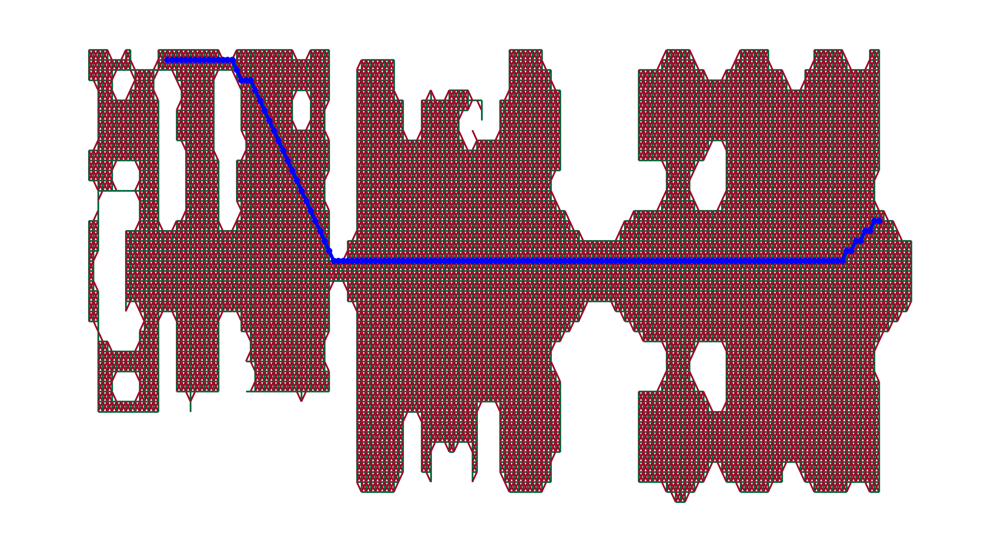

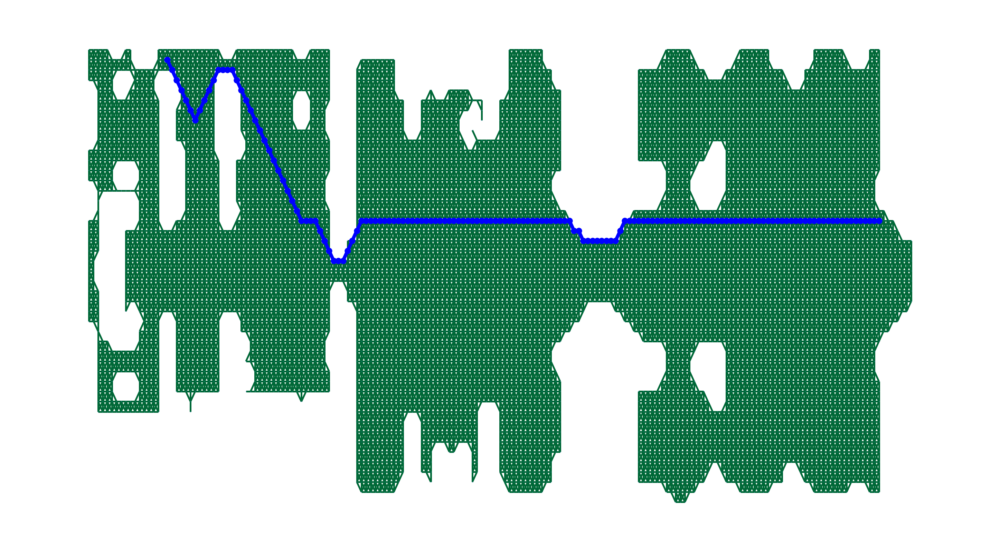

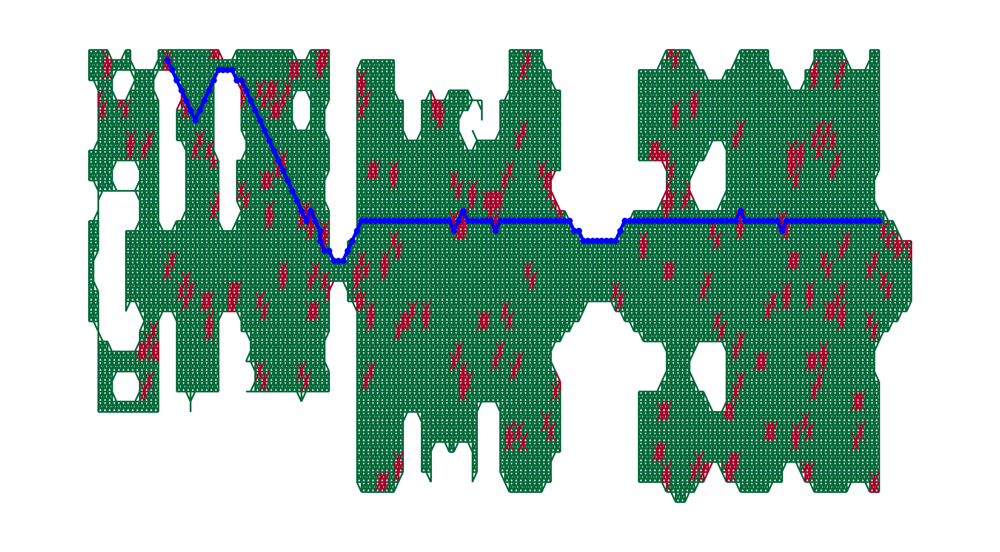

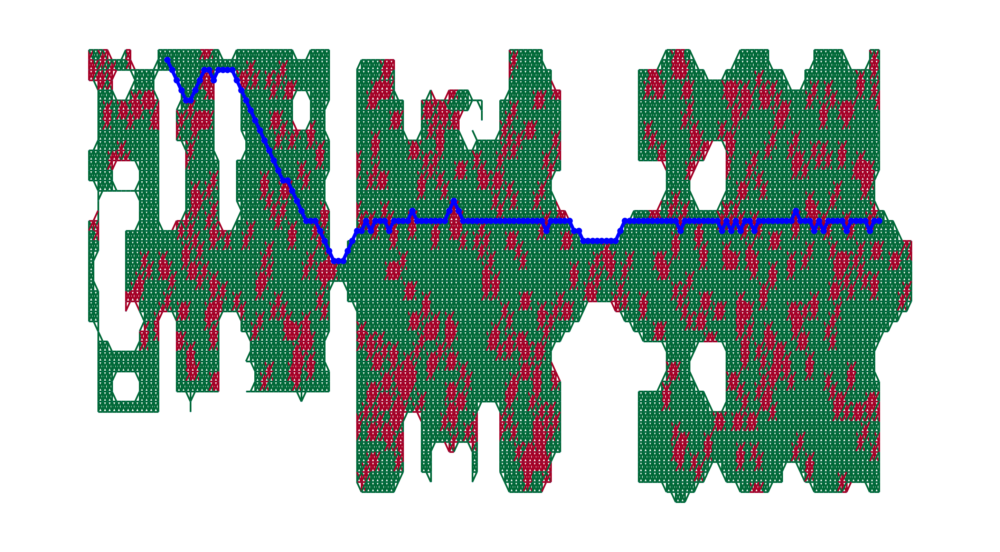

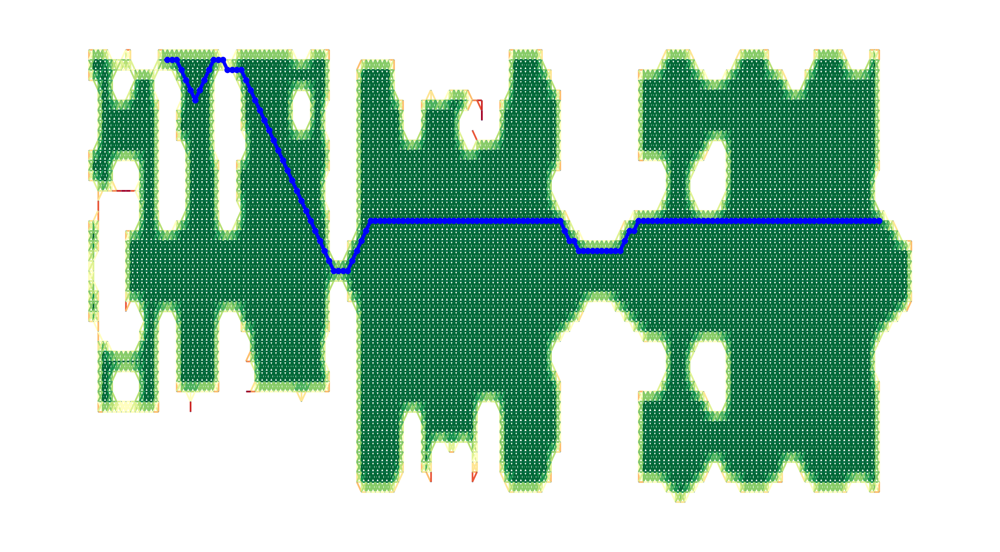

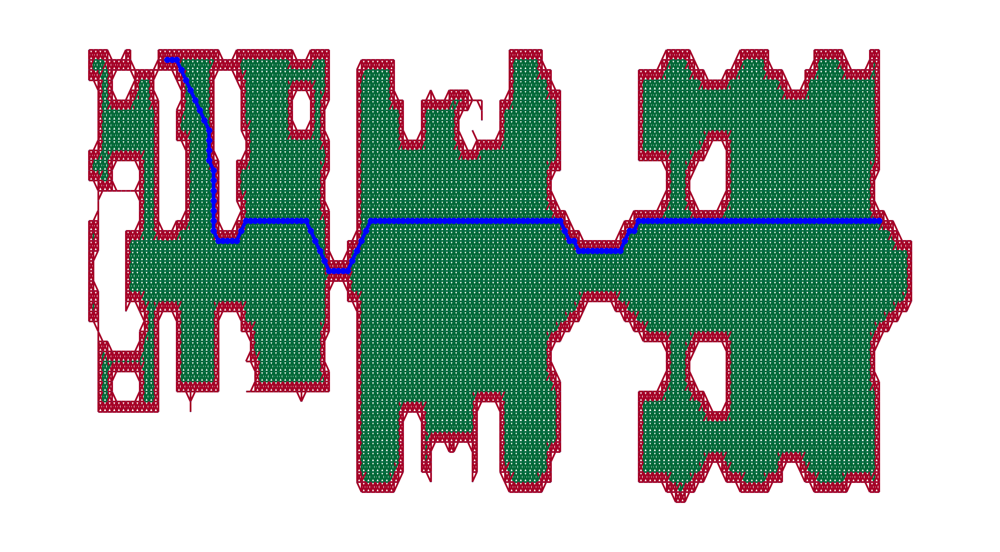

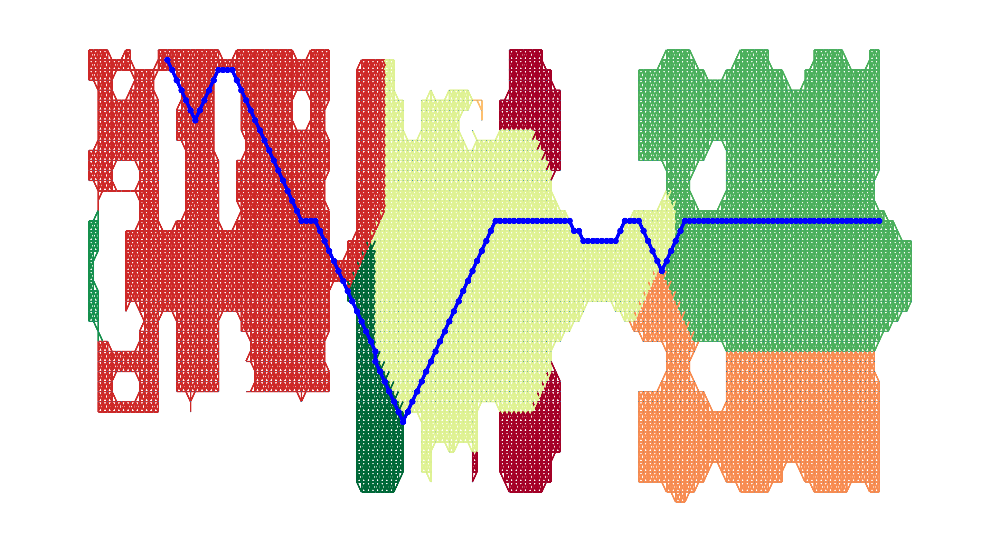

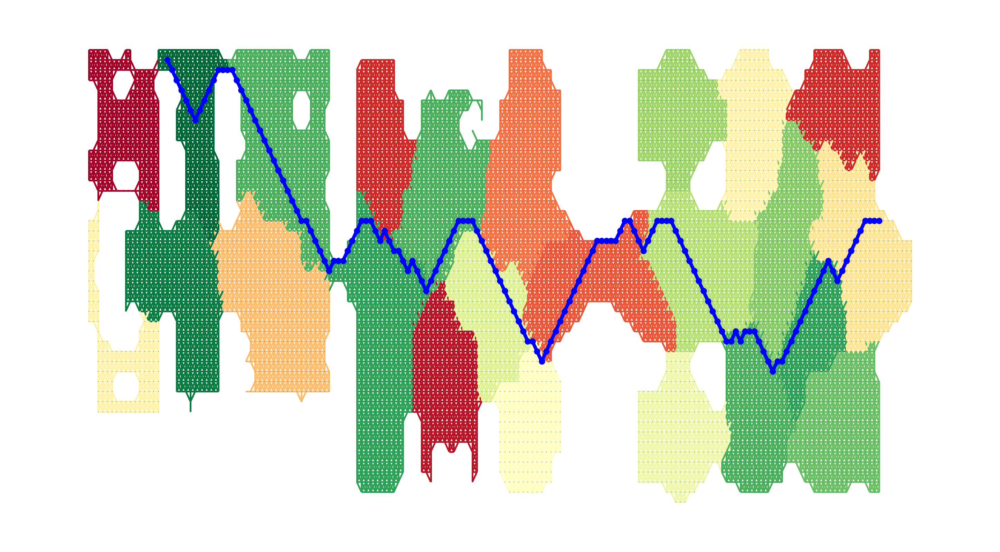

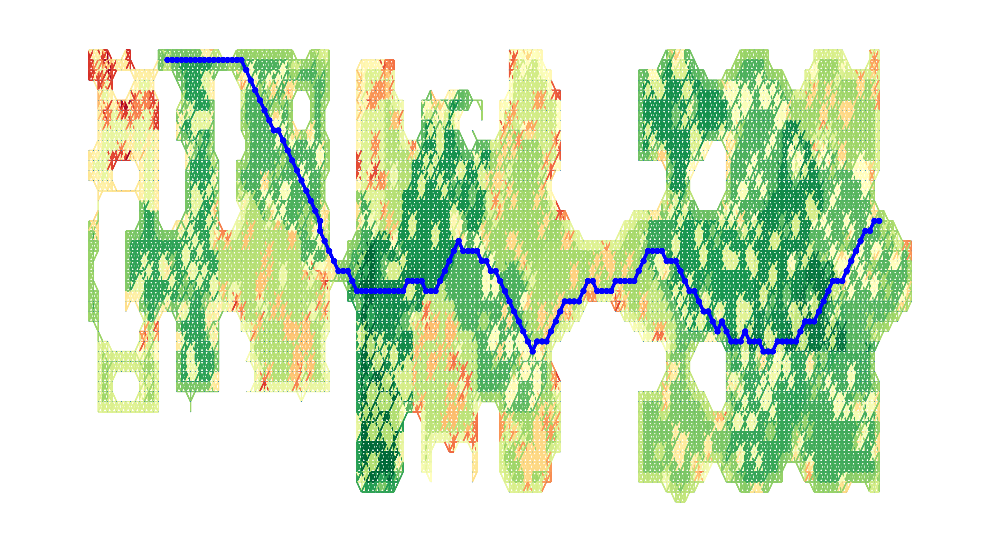

In [142]:
# draw graph for each objective
# edges = G.edges()
# pos = {(x,y):(y,-x) for x,y in G.nodes()}
# for ob in objectives:
#     color = [G[u][v][ob] for u,v in edges]
#     plt.figure(figsize=(40,22))
#     nx.draw(G, pos, with_labels=False, node_size=1, edge_color = color, width=5, edge_cmap = plt.cm.RdYlGn_r)
#     plt.show()

# draw path for each objective for a specific map
lastpaths = data[-1][1][22][-1]
# print(lastpaths)
# for j in range(0,len(lastpaths)):
#     print(j, dist(lastpaths[j][0], lastpaths[j][1]))

edges = G.edges()
pos = {(x,y):(y,-x) for x,y in G.nodes()}
for i in range(len(lastpaths)):
    color = [G[u][v][objs[i]] for u,v in edges]
    plt.figure(figsize=(40,22))
    nx.draw(G, pos, with_labels=False, node_size=1, edge_color = color, width=5, edge_cmap = plt.cm.RdYlGn_r)
    path = lastpaths[i]
    path_edges = list(zip(path,path[1:]))
    nx.draw_networkx_nodes(G,pos,nodelist=path,node_color='b')
    nx.draw_networkx_edges(G,pos,edgelist=path_edges,edge_color='b',width=10)
    plt.show()

In [2]:
path = lastpaths[0]
path_edges = list(zip(path,path[1:])

SyntaxError: unexpected EOF while parsing (2300319234.py, line 2)